# Movie Genre Classification [TF-IDF](https://scikit-learn.org/1.5/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) and [Naive Bayes](https://scikit-learn.org/1.5/modules/naive_bayes.html)

### Temu Kembali Informasi 7C

This notebook is an example of how to use the TF-IDF and Naive Bayes algorithms to classify movie genres. And also this notebook for mid-term project of the course "Temu Kembali Informasi" in Univesity of Muhammadiyah Malang.

The dataset if from kaggle: https://www.kaggle.com/datasets/hijest/genre-classification-dataset-imdb

Download the dataset, name it "Genre Classification Dataset", and extract it to the folder where this notebook is located.

The dataset contains 3 files:
- `train_data.csv`: contains the movie title, plot, and genre.
- `test_data.csv`: contains the movie title, plot, and genre.
- `test_data_solution.csv`: contains the movie title, plot, and genre.
- `description.csv`: contains the train and test data description.

Then download the requirements.txt file and run the following command to install the required libraries:
```bash
pip install -r requirements.txt
```

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud

In [2]:
import nltk
import os

# Set the custom download path for NLTK data
custom_download_path = '/kaggle/working/nltk_data'

# Make sure the directory exists; if not, create it
os.makedirs(custom_download_path, exist_ok=True)

# Append the custom download path to NLTK data path
nltk.data.path.append(custom_download_path)

nltk.download('punkt', download_dir=custom_download_path)
nltk.download('punkt_tab', download_dir=custom_download_path)
nltk.download('stopwords', download_dir=custom_download_path)
nltk.download('wordnet', download_dir=custom_download_path)

[nltk_data] Downloading package punkt to /kaggle/working/nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /kaggle/working/nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     /kaggle/working/nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     /kaggle/working/nltk_data...


True

In [3]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

In [4]:
# Read the txt files using pandas
train_data = pd.read_csv("Genre Classification Dataset/train_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data  = pd.read_csv("Genre Classification Dataset/test_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data_solution  = pd.read_csv("Genre Classification Dataset/test_data_solution.txt", delimiter=':::' ,header = None ,engine='python')

In [5]:
## View train data
print("shape",train_data.shape)
train_data.head()

shape (54214, 4)


,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [6]:
## View the test solution data
print("shape",test_data_solution.shape)
test_data_solution.head()

shape (54200, 4)


,0,1,2,3
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


In [7]:
## We will concat the test and train file

df = pd.concat((train_data ,test_data_solution))
df.columns = ["id" ,"Title","Genre","Description"]
df.head()

,id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [8]:
## Check the size
df.shape

(108414, 4)

In [9]:
## Check for Duplicates and Remove them
df.duplicated().sum() ## Will give us a number of duplicates
df.drop_duplicates(inplace = True)  ## Will drops any duplicates

In [10]:
## Check for nan values
df.isna().sum()  # Will check for any duplicates
df.dropna( inplace = True ) ## Will drop any nan containing row if exists

In [11]:
## Check the size
df.shape

(108414, 4)

In [12]:
## function to preprocess the data
stopword = set(stopwords.words('english'))

def preprocessing(text):
    # Convert text to lowercase
    text = text.lower()

    # Remove punctuation using regular expressions
    text = re.sub(r'[^\w\s]', '', text)

    # Remove specific characters #, @, and $
    text = re.sub(r'[#@\$]', '', text)

    # tokenize and convert to list
    tokens = word_tokenize(text)

    ## Lemmatize it
    lemmatizer  = WordNetLemmatizer()

    ## lemmatize each token
    # text = [lemmatizer.lemmatize(token) for token in tokens]
    text = text.split()

    text = [word for word in text if word not in stopword]


    return " ".join(text)

In [13]:
## Create list of words in discription column
df["Despcription_clean"] = df["Description"].apply(preprocessing)

In [14]:
df.head()

,id,Title,Genre,Description,Despcription_clean
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [15]:
## Shows us the label counts
df["Genre"].value_counts()

Genre
drama           27225
documentary     26192
comedy          14893
short           10145
horror           4408
thriller         3181
action           2629
western          2064
reality-tv       1767
family           1567
adventure        1550
music            1462
romance          1344
sci-fi           1293
adult            1180
crime            1010
animation         996
sport             863
talk-show         782
fantasy           645
mystery           637
musical           553
biography         529
history           486
game-show         387
news              362
war               264
Name: count, dtype: int64

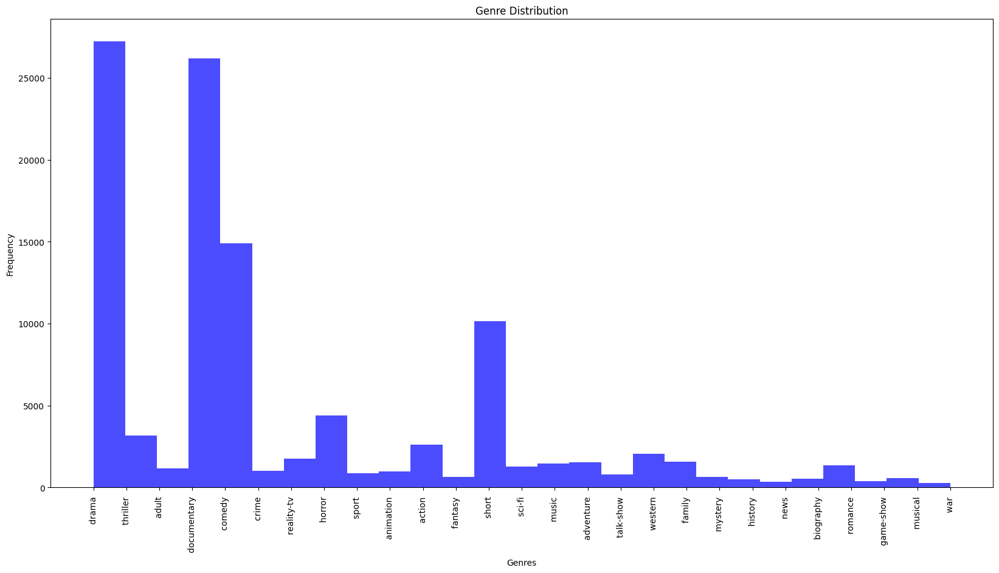

In [16]:
# Create a histogram of genre distribution
plt.figure(figsize=(20, 10))
plt.hist(df["Genre"],bins =27 , color='blue', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

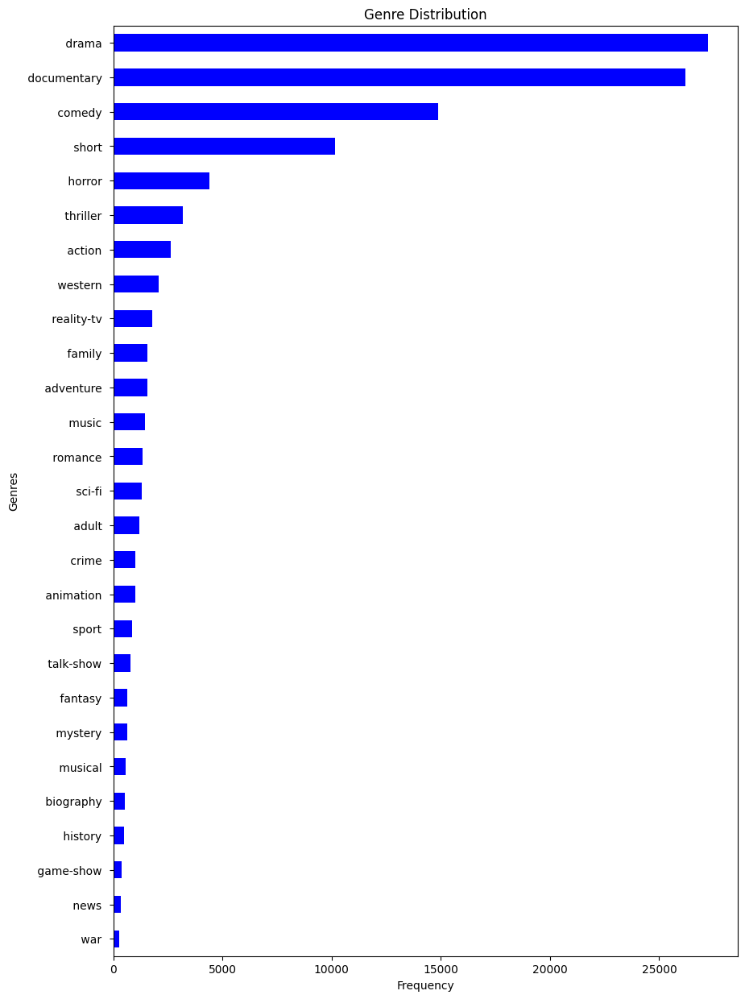

In [17]:
## View genre distribution on Horizontal graph
genre_counts = df["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)

# Create a horizontal histogram of genre distribution
plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

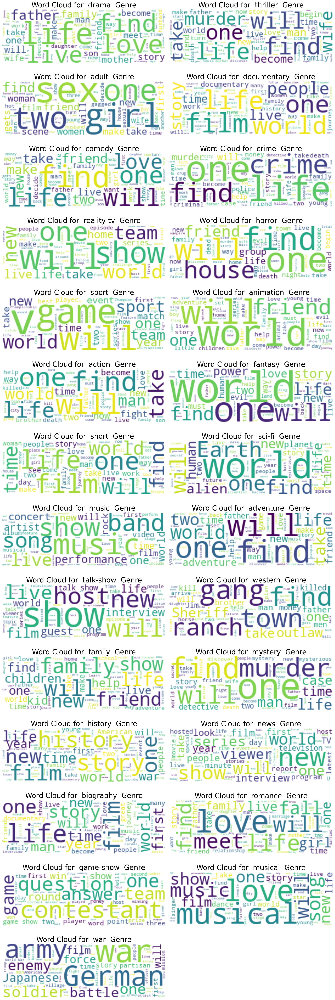

In [18]:
# Create a list of unique genres from the dataset
genres = df['Genre'].unique()

# Set the figure size outside the loop
plt.figure(figsize=(20, 60))

# Iterate over each genre
for i, genre in enumerate(genres, 1):
    plt.subplot(14, 2, i)  # Assuming you have 14 rows and 2 columns for 28 genres
    text_subset = " ".join(list(df[df["Genre"] == genre]['Description']))
    wordcloud = WordCloud(max_words=300, width=300, height=100, background_color='white').generate(text_subset)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre',fontsize=30)
    plt.axis('off')


plt.tight_layout()
plt.show()

In [19]:
## remove id column from head
data = df.drop(["Title","id"] , axis = 1) # will drop column
data.head()

,Genre,Description,Despcription_clean
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [20]:
## import necessary library for
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

In [21]:
#Convert sentiment labels to numerical values for modeling
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

class_names= list(label_encoder.classes_)
class_names

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [22]:
data.head()

,Genre,Description,Despcription_clean,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


In [23]:
## Split the data
x = data["Despcription_clean"]
y = data["Genre"]

x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

In [24]:
vectorize = CountVectorizer()
x_train1 = vectorize.fit_transform(x_train)
x_test1 =  vectorize.transform(x_test)

Model Score on Training data 0.6406921615289538
Model Score on Training data 0.5224048554614718
               precision    recall  f1-score   support

      action        0.05      0.62      0.09       100
       adult        0.01      0.67      0.03        12
   adventure        0.08      0.63      0.14        90
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00        25
      comedy        0.45      0.53      0.49      6353
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.56      0.69     20764
       drama        0.83      0.46      0.59     24569
      family        0.00      1.00      0.00         2
     fantasy        0.00      0.00      0.00         0
   game-show        0.15      1.00      0.26        29
     history        0.00      0.00      0.00         0
      horror        0.24      0.78      0.37       696
       music        0.04      0.86      0.08        37
     musical        0.0

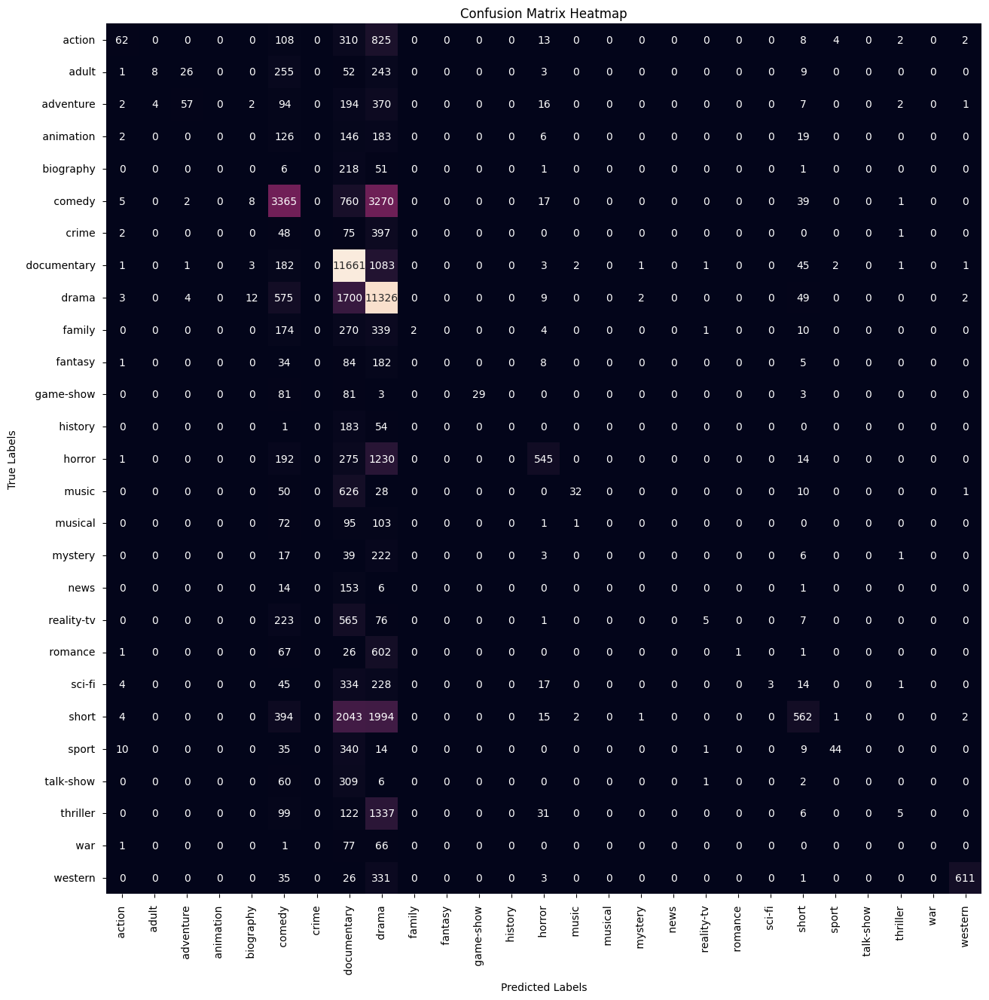

In [25]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)

print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9972881731141734
Model Score on Training data 0.5671592229785821
               precision    recall  f1-score   support

      action        0.31      0.41      0.36      1012
       adult        0.38      0.60      0.47       380
   adventure        0.21      0.39      0.28       410
   animation        0.16      0.37      0.22       210
   biography        0.01      0.09      0.02        33
      comedy        0.58      0.53      0.55      8135
       crime        0.08      0.19      0.11       226
 documentary        0.78      0.70      0.74     14412
       drama        0.69      0.56      0.62     16691
      family        0.17      0.32      0.23       425
     fantasy        0.08      0.25      0.12       106
   game-show        0.55      0.83      0.66       131
     history        0.02      0.15      0.04        33
      horror        0.57      0.65      0.61      1973
       music        0.48      0.64      0.55       562
     musical        0.1

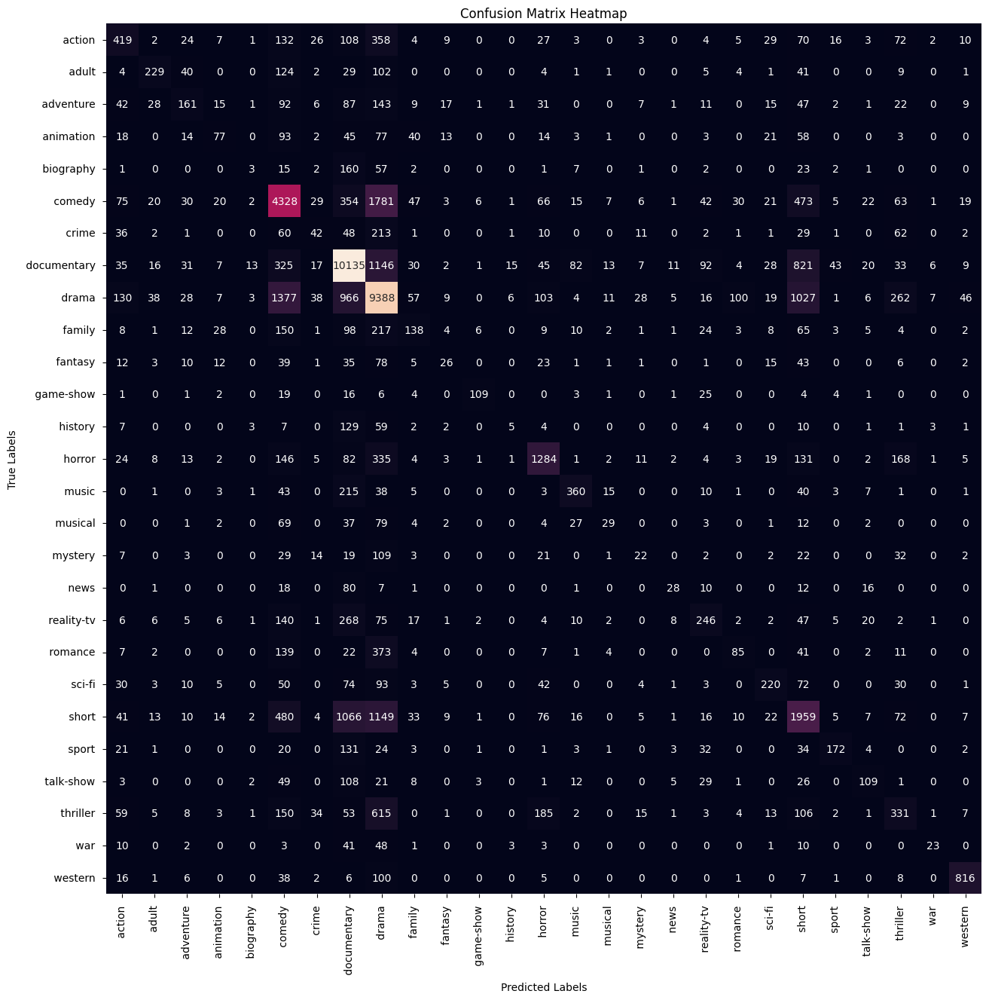

In [26]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on Training data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9996863873669453
Model Score on Training data 0.5191580423192577
               precision    recall  f1-score   support

      action        0.29      0.34      0.31      1122
       adult        0.37      0.50      0.42       433
   adventure        0.21      0.30      0.25       533
   animation        0.15      0.23      0.18       315
   biography        0.02      0.05      0.03       117
      comedy        0.52      0.49      0.51      7888
       crime        0.09      0.14      0.11       339
 documentary        0.73      0.69      0.71     13783
       drama        0.60      0.54      0.57     15168
      family        0.15      0.22      0.18       563
     fantasy        0.07      0.13      0.09       178
   game-show        0.58      0.70      0.64       162
     history        0.03      0.05      0.03       111
      horror        0.55      0.57      0.56      2188
       music        0.47      0.58      0.52       606
     musical        0.0

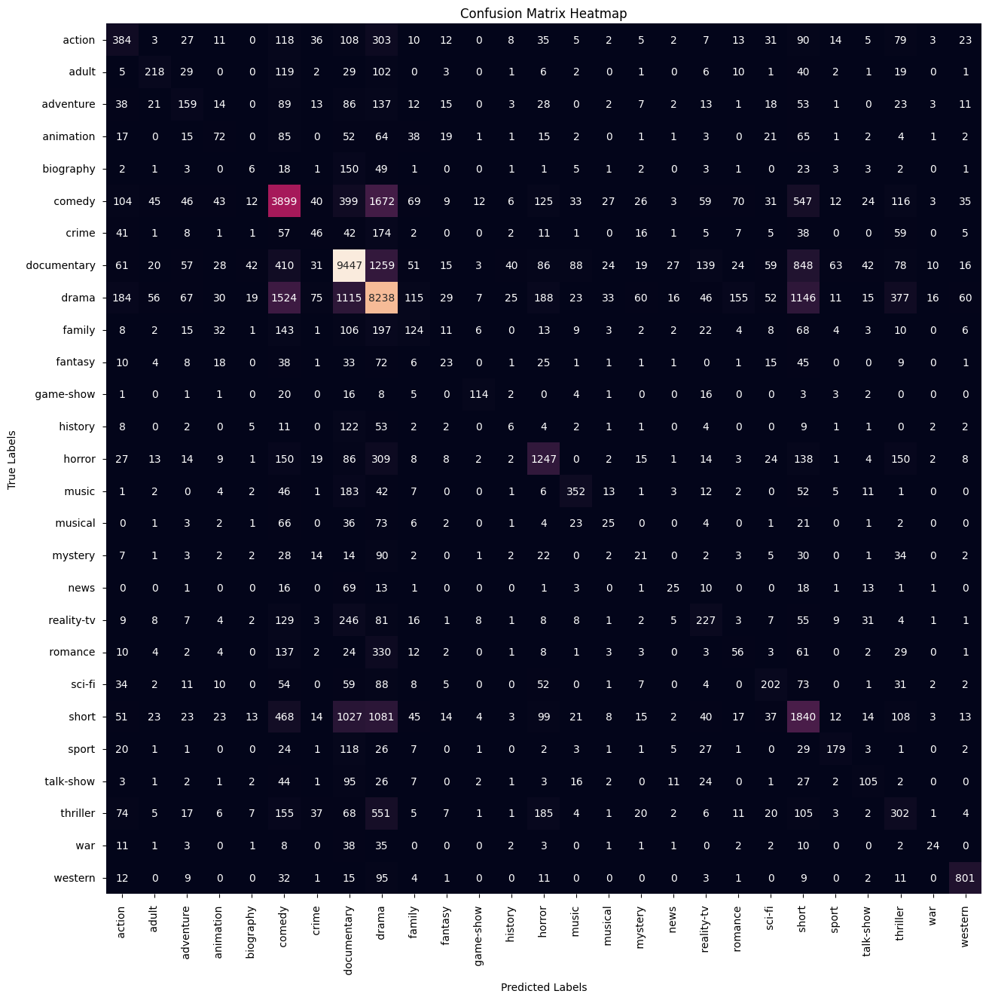

In [27]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on Training data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Random Forest - Train Score: 0.9996863873669453
Random Forest - Test Score: 0.4877967790137805
               precision    recall  f1-score   support

      action        0.01      0.56      0.02        25
       adult        0.04      0.96      0.08        26
   adventure        0.12      0.70      0.20       126
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         0
      comedy        0.25      0.56      0.35      3366
       crime        0.00      0.50      0.00         2
 documentary        0.89      0.55      0.68     20777
       drama        0.85      0.41      0.55     28227
      family        0.02      0.90      0.04        20
     fantasy        0.00      0.00      0.00         4
   game-show        0.43      0.89      0.58        94
     history        0.00      0.00      0.00         2
      horror        0.11      0.73      0.20       349
       music        0.08      0.84      0.15        73
     musical        0.02

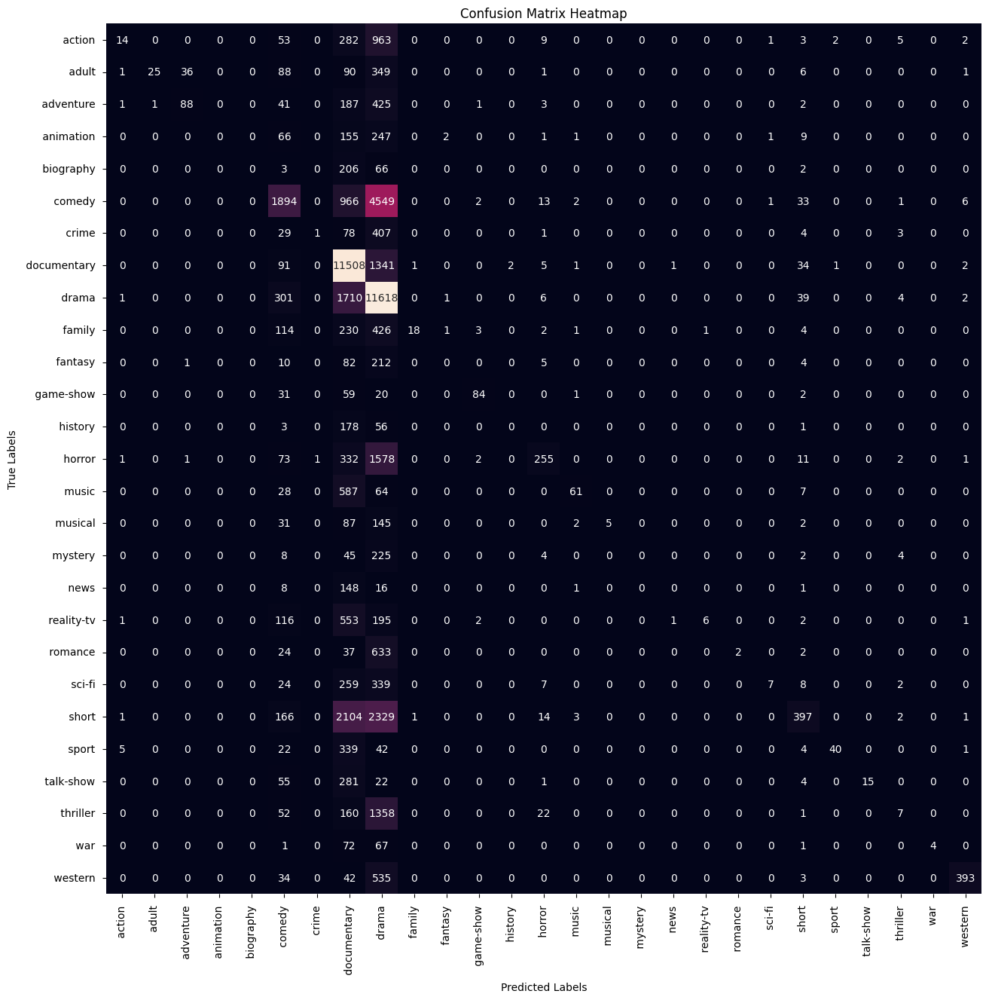

In [28]:
# Create a Random Forest model
random_forest = RandomForestClassifier()

# Fit the model with GridSearchCV
random_forest.fit(x_train1, y_train)
print("Random Forest - Train Score:",random_forest.score(x_train1, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test1, y_test))

y_pred = random_forest.predict(x_test1)
print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [29]:
## Using TfidfVectorizer technique
vectorizer = TfidfVectorizer()
x_train2 = vectorize.fit_transform(x_train)
x_test2 =  vectorize.transform(x_test)

Model Score on Training data 0.6406921615289538
Model Score on Training data 0.5224048554614718
               precision    recall  f1-score   support

      action        0.05      0.62      0.09       100
       adult        0.01      0.67      0.03        12
   adventure        0.08      0.63      0.14        90
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00        25
      comedy        0.45      0.53      0.49      6353
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.56      0.69     20764
       drama        0.83      0.46      0.59     24569
      family        0.00      1.00      0.00         2
     fantasy        0.00      0.00      0.00         0
   game-show        0.15      1.00      0.26        29
     history        0.00      0.00      0.00         0
      horror        0.24      0.78      0.37       696
       music        0.04      0.86      0.08        37
     musical        0.0

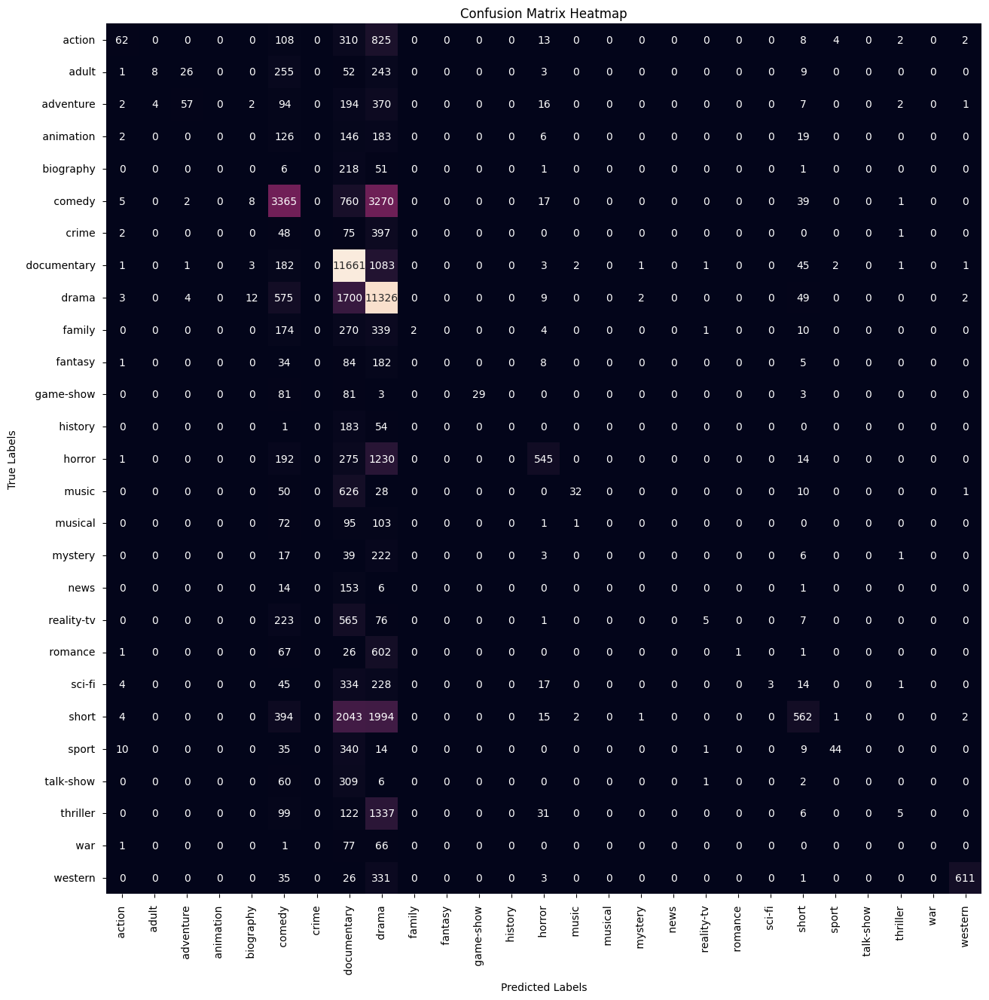

In [30]:
mnb = MultinomialNB()
mnb.fit(x_train2 ,y_train)
print("Model Score on Training data",mnb.score(x_train2 ,y_train))
print("Model Score on Training data",mnb.score(x_test2 ,y_test))
y_pred = mnb.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9972881731141734
Model Score on Training data 0.5671592229785821
               precision    recall  f1-score   support

      action        0.31      0.41      0.36      1012
       adult        0.38      0.60      0.47       380
   adventure        0.21      0.39      0.28       410
   animation        0.16      0.37      0.22       210
   biography        0.01      0.09      0.02        33
      comedy        0.58      0.53      0.55      8135
       crime        0.08      0.19      0.11       226
 documentary        0.78      0.70      0.74     14412
       drama        0.69      0.56      0.62     16691
      family        0.17      0.32      0.23       425
     fantasy        0.08      0.25      0.12       106
   game-show        0.55      0.83      0.66       131
     history        0.02      0.15      0.04        33
      horror        0.57      0.65      0.61      1973
       music        0.48      0.64      0.55       562
     musical        0.1

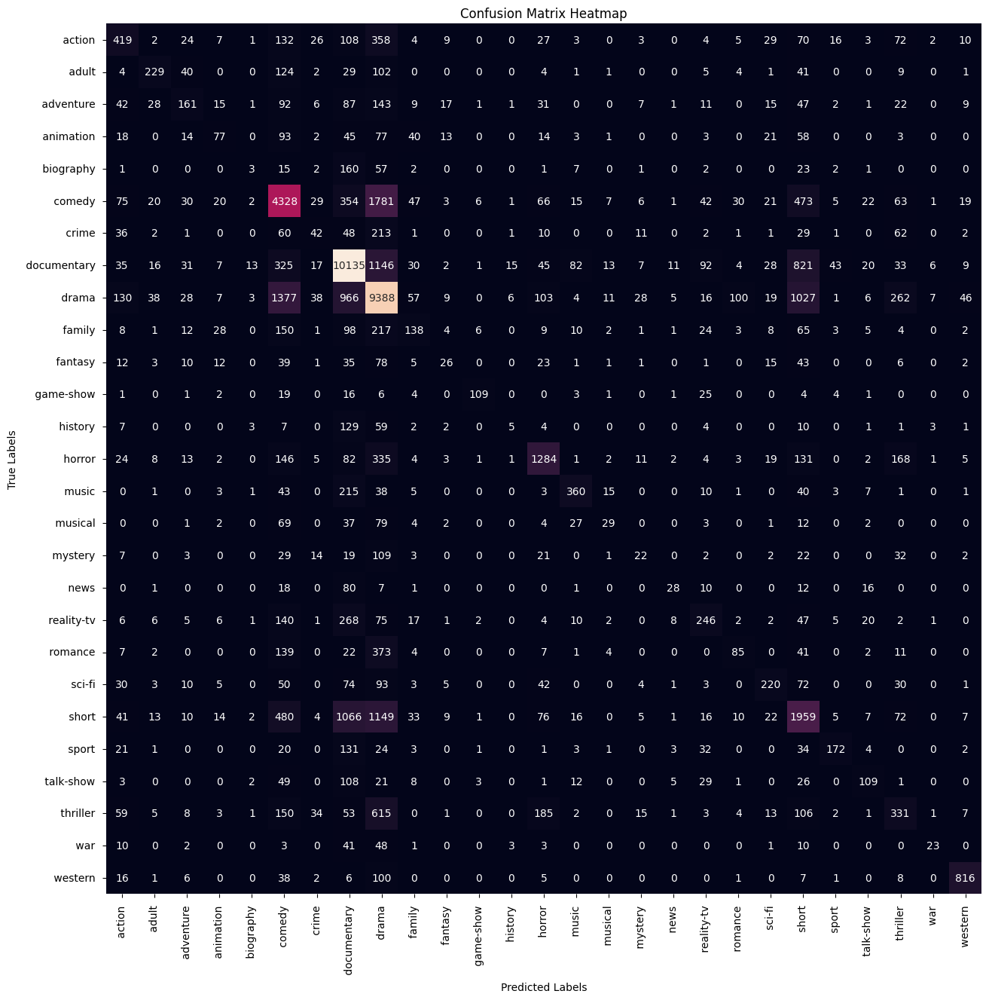

In [31]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train2 ,y_train)
print("Model Score on Training data",model.score(x_train2 ,y_train))
print("Model Score on Training data",model.score(x_test2 ,y_test))
y_pred = model.predict(x_test2)
print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9996863873669453
Model Score on Training data 0.5192133857250909
               precision    recall  f1-score   support

      action        0.29      0.34      0.31      1123
       adult        0.37      0.50      0.42       435
   adventure        0.21      0.30      0.25       533
   animation        0.15      0.23      0.18       314
   biography        0.02      0.05      0.03       117
      comedy        0.52      0.49      0.51      7886
       crime        0.09      0.14      0.11       339
 documentary        0.73      0.69      0.71     13786
       drama        0.60      0.54      0.57     15167
      family        0.15      0.22      0.18       563
     fantasy        0.07      0.13      0.09       179
   game-show        0.57      0.70      0.63       161
     history        0.03      0.05      0.03       110
      horror        0.55      0.57      0.56      2186
       music        0.47      0.58      0.52       606
     musical        0.0

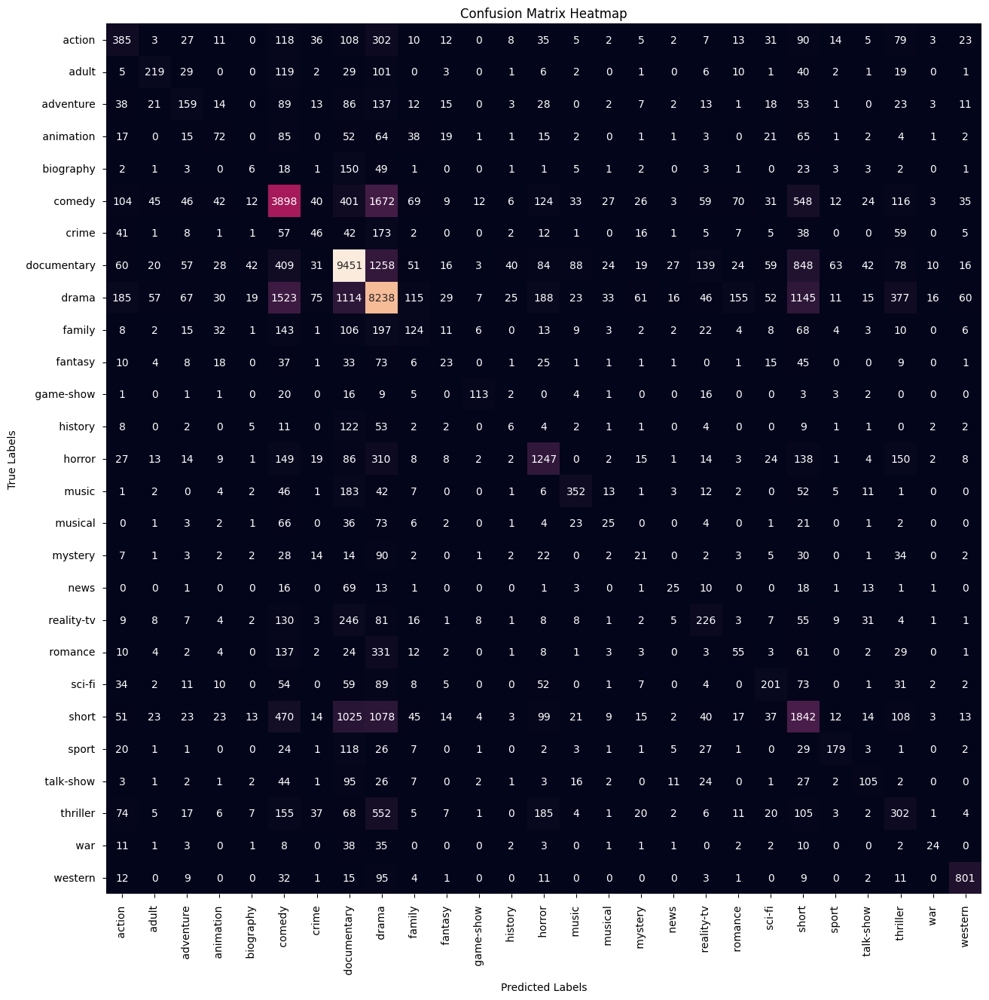

In [32]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train2 ,y_train)
print("Model Score on Training data",svm.score(x_train2 ,y_train))
print("Model Score on Training data",svm.score(x_test2 ,y_test))
y_pred = svm.predict(x_test2)
print(classification_report(y_pred ,y_test))

## As we can see from accuracy that the model the not performing well
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Random Forest - Train Score: 0.9996863873669453
Random Forest - Test Score: 0.4889958861401664
               precision    recall  f1-score   support

      action        0.01      0.60      0.02        20
       adult        0.06      0.77      0.10        43
   adventure        0.11      0.66      0.18       122
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         0
      comedy        0.26      0.58      0.36      3381
       crime        0.00      1.00      0.00         1
 documentary        0.88      0.55      0.68     20766
       drama        0.85      0.41      0.56     28217
      family        0.02      0.90      0.04        20
     fantasy        0.00      0.00      0.00         4
   game-show        0.45      0.87      0.59       101
     history        0.00      0.00      0.00         2
      horror        0.11      0.70      0.20       365
       music        0.06      0.84      0.11        55
     musical        0.02

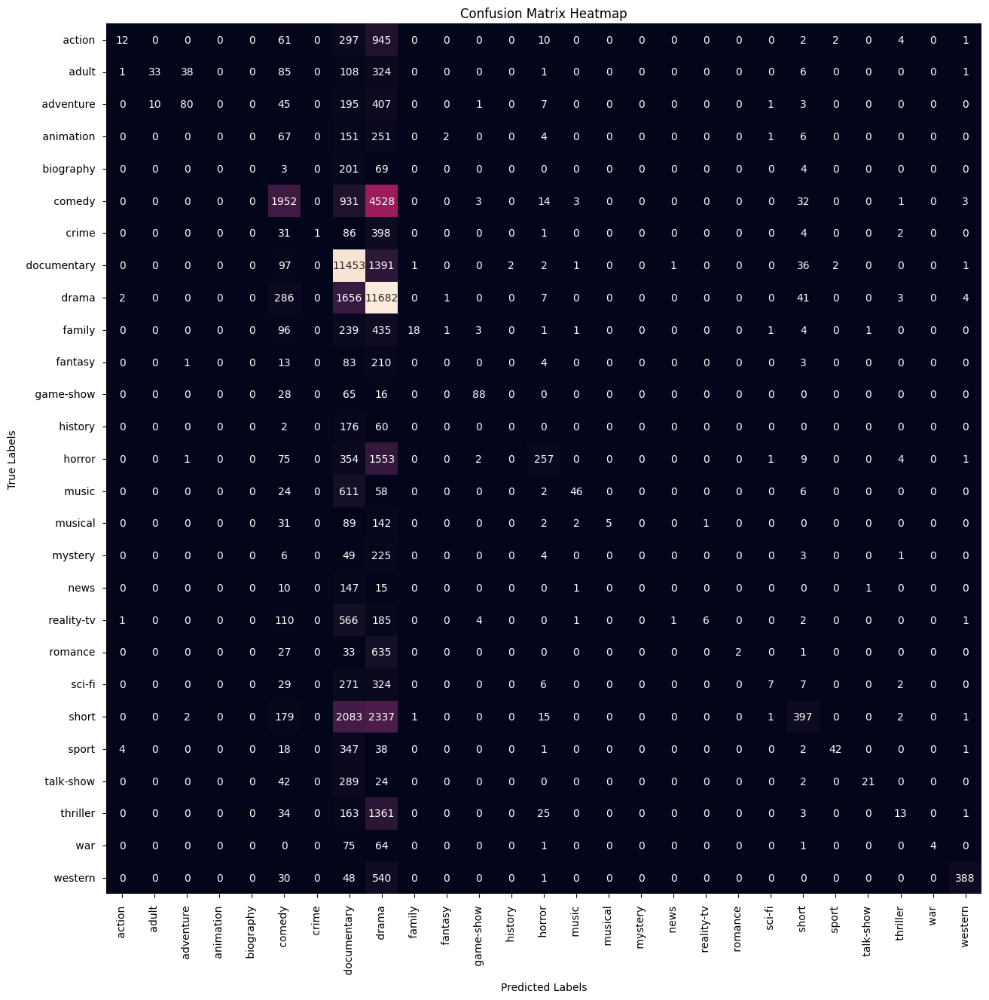

In [33]:
# Create a Random Forest model
random_forest = RandomForestClassifier()

# Fit the model with GridSearchCV
random_forest.fit(x_train2, y_train)

print("Random Forest - Train Score:",random_forest.score(x_train2, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test2, y_test))

y_pred = random_forest.predict(x_test2)
print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

In [35]:
# Create Naive Bayes model
naive_bayes = MultinomialNB()
naive_bayes.fit(x_train2, y_train)

MultinomialNB()

In [36]:
# Evaluate Naive Bayes model
print("Naive Bayes - Train Score:", naive_bayes.score(x_train2, y_train))
print("Naive Bayes - Test Score:", naive_bayes.score(x_test2, y_test))
y_pred_nb = naive_bayes.predict(x_test2)
print("Naive Bayes Classification Report:")
print(classification_report(y_pred_nb, y_test))

Naive Bayes - Train Score: 0.6406921615289538
Naive Bayes - Test Score: 0.5224048554614718
Naive Bayes Classification Report:
               precision    recall  f1-score   support

      action        0.05      0.62      0.09       100
       adult        0.01      0.67      0.03        12
   adventure        0.08      0.63      0.14        90
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00        25
      comedy        0.45      0.53      0.49      6353
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.56      0.69     20764
       drama        0.83      0.46      0.59     24569
      family        0.00      1.00      0.00         2
     fantasy        0.00      0.00      0.00         0
   game-show        0.15      1.00      0.26        29
     history        0.00      0.00      0.00         0
      horror        0.24      0.78      0.37       696
       music        0.04      0.86      0.08    

In [37]:
# Create Logistic Regression model
logistic_regression = LogisticRegression()
logistic_regression.fit(x_train2, y_train)

LogisticRegression()

In [38]:
# Evaluate Logistic Regression model
print("\nLogistic Regression - Train Score:", logistic_regression.score(x_train2, y_train))
print("Logistic Regression - Test Score:", logistic_regression.score(x_test2, y_test))
y_pred_lr = logistic_regression.predict(x_test2)
print("Logistic Regression Classification Report:")
print(classification_report(y_pred_lr, y_test))


Logistic Regression - Train Score: 0.9972881731141734
Logistic Regression - Test Score: 0.5671592229785821
Logistic Regression Classification Report:
               precision    recall  f1-score   support

      action        0.31      0.41      0.36      1012
       adult        0.38      0.60      0.47       380
   adventure        0.21      0.39      0.28       410
   animation        0.16      0.37      0.22       210
   biography        0.01      0.09      0.02        33
      comedy        0.58      0.53      0.55      8135
       crime        0.08      0.19      0.11       226
 documentary        0.78      0.70      0.74     14412
       drama        0.69      0.56      0.62     16691
      family        0.17      0.32      0.23       425
     fantasy        0.08      0.25      0.12       106
   game-show        0.55      0.83      0.66       131
     history        0.02      0.15      0.04        33
      horror        0.57      0.65      0.61      1973
       music        0.4

In [39]:
# Create Support Vector Machines (SVM) model
svm_classifier = SVC()
svm_classifier.fit(x_train2, y_train)

SVC()

In [40]:
# Evaluate SVM model
print("\nSupport Vector Machines (SVM) - Train Score:", svm_classifier.score(x_train2, y_train))
print("Support Vector Machines (SVM) - Test Score:", svm_classifier.score(x_test2, y_test))
y_pred_svm = svm_classifier.predict(x_test2)
print("SVM Classification Report:")
print(classification_report(y_pred_svm, y_test))


Support Vector Machines (SVM) - Train Score: 0.7975907170660615
Support Vector Machines (SVM) - Test Score: 0.562104525245817
SVM Classification Report:
               precision    recall  f1-score   support

      action        0.15      0.53      0.23       363
       adult        0.15      0.72      0.25       124
   adventure        0.13      0.65      0.21       147
   animation        0.02      0.61      0.04        18
   biography        0.00      0.00      0.00         0
      comedy        0.54      0.52      0.53      7657
       crime        0.00      0.50      0.01         4
 documentary        0.86      0.65      0.74     17344
       drama        0.82      0.49      0.62     22767
      family        0.03      0.66      0.06        41
     fantasy        0.00      0.33      0.01         3
   game-show        0.24      0.83      0.38        58
     history        0.00      0.00      0.00         0
      horror        0.45      0.69      0.54      1473
       music        